# Import some packages

In [1]:
import os
import numpy as np
import pandas as pd
import xarray as xr
import matplotlib.pyplot as plt
from typing import Iterable, NamedTuple, Literal, TypeAlias, Callable, Optional, Union, Any, List, Dict,Tuple
from collections import namedtuple

import openseespy.opensees as ops
import opstool as opst
import opstool.vis.plotly as opsplt
import opstool.vis.pyvista as opsvis


# Set base variables

In [2]:
# Set unit
UNIT = opst.pre.UnitSystem(length = "m",force = "kn",time = "sec")

# Set constant
g = 9.80665 * (UNIT.m / UNIT.sec ** 2)
Ubig = 1.e10
Usmall = 1.e-10

# Set data path
data_path = './OutData'
os.makedirs(data_path, exist_ok=True)
opst.post.set_odb_path(data_path) # set opstool ODB path

# Section creator function

In [3]:
def secCreate(
    sec_name: str, secTag: int, matTag: int,
    w: float, h: float,
    info: bool = True
    ) -> Dict[str, Any]:
    
    """
    # Just for a simple rectangle section
    
    :param sec_name: section name
    :param secTag: section tag
    :param matTag: material tag
    :param w: width
    :param h: height
    :param info: if True, print section information
    
    :return: a dictionary with the section properties
    
    """
    
    # section outline
    sec_outline = [[0, 0], [w, 0], [w, h], [0, h]]
    inner_geo = opst.pre.section.create_polygon_patch(sec_outline)
    SEC = opst.pre.section.FiberSecMesh(sec_name=sec_name)
    SEC.add_patch_group({"inner": inner_geo})
    SEC.set_ops_mat_tag({"inner": matTag})
    SEC.set_mesh_size({"inner": (w + h) / 20.})
    SEC.set_mesh_color({"inner": "lightblue"})
    SEC.mesh()

    # section properties
    SEC.centring()
    sec_props = SEC.get_frame_props(display_results=info) # print section properties
    
    if info:
        SEC.view(fill=True, show_legend=True, aspect_ratio='equal')
        plt.show()

    # define section
    SEC.to_opspy_cmds(secTag=secTag, G=100 * UNIT.gpa)

    return {
        'code': SEC,
        'porps': sec_props,
        }

# Model creater function

In [4]:
# Values for return
RETURN_VAL = namedtuple("RETURN_VAL", ["ctrl_node", "remove_ele", "add_ele", "top_link_ele", "base_link_ele", "sections"])
'''
Remove element:
    ops.remove('ele', RETURN_VAL.remove_ele)
Add element: 
    ops.element(*RETURN_VAL.add_ele)
'''

# Model creater function
def triangleStruc(top_free: bool = False, base_free: bool = False, info: bool = True) -> RETURN_VAL:
    
    """
    # Create a simple triangle structure
    
    :param top_free: if True, add zeroLength element to the top
    :param base_free: if True, add zeroLengthSection element to the base
    :param info: if True, print section element information
    
    :return a namedtuple with the following values:
    - :ctrl_node: the control node for static analysis
    - :remove_ele: the element to be removed
    - :add_ele: the element to be added
    - :top_link_ele: the top zeroLength element
    - :base_link_ele: the base zeroLengthSection element
    """
    
    "# ----- ----- ----- ----- ----- ----- ----- ----- ----- ----- ----- ----- ----- ----- ----- -----"
    # Initialize
    ops.wipe()
    ops.model('basic', '-ndm', 3, '-ndf', 6)

    # For vertical element
    transf_ver = 1
    ops.geomTransf('PDelta', transf_ver, *(-1, 0, 0))
    # For other element
    transf_other = 2
    ops.geomTransf('PDelta', transf_other, *(0, 0, 1))

    "# ----- ----- ----- ----- ----- ----- ----- ----- ----- ----- ----- ----- ----- ----- ----- -----"
    # Steel material
    steelTag = 10
    ops.uniaxialMaterial('Steel02', steelTag, 400 * UNIT.mpa, 206 * UNIT.gpa, 0.01)
    
    # Elastic no tension material
    ENTTag = 20
    ops.uniaxialMaterial('ENT', ENTTag, 200 * UNIT.gpa)
    
    # Elastic material
    elasticTag = 30
    ops.uniaxialMaterial('Elastic', elasticTag, 1.e6)

    "# ----- ----- ----- ----- ----- ----- ----- ----- ----- ----- ----- ----- ----- ----- ----- -----"
    # Define vertical element section
    secTag_1 = 1
    W_1 = 10. * UNIT.cm
    H_1 = 10. * UNIT.cm
    sec_1 = secCreate(sec_name='vertical', secTag=secTag_1, matTag=steelTag, w=W_1, h=H_1, info=info)

    # Define vertical base link element section
    secTag_2 = 2
    sec_2 = secCreate(sec_name='vertical base', secTag=secTag_2, matTag=ENTTag, w=W_1, h=H_1, info=info)

    # Define other element section
    secTag_3 = 3
    W_2 = 2. * UNIT.cm
    H_2 = 2. * UNIT.cm
    sec_3 = secCreate(sec_name='oblique', secTag=secTag_3, matTag=steelTag, w=W_2, h=H_2, info=info)

    "# ----- ----- ----- ----- ----- ----- ----- ----- ----- ----- ----- ----- ----- ----- ----- -----"
    # Node Tags
    nodeTag_base = 1
    nodeTag_top = 2
    nodeTag_base_link = 3 # Base link node
    nodeTag_top_link = 4 # Top link node
    nodeTag_left_base = 5
    nodeTag_right_base = 6
    
    # Element Tags
    eleTag_main = 1
    eleTag_left = 2
    eleTag_right = 3
    eleTag_base_link = 4 # Base link element
    eleTag_top_link = 5 # Top link element
    
    "# ----- ----- ----- ----- ----- ----- ----- ----- ----- ----- ----- ----- ----- ----- ----- -----"
    # Create nodes
    ops.node(nodeTag_base, 0., 0., 0.)
    ops.node(nodeTag_top, 0., 0., 1. * UNIT.m)
    ops.node(nodeTag_left_base, 0., -1. * UNIT.m, 0.)
    ops.node(nodeTag_right_base, 0., 1. * UNIT.m, 0.)

    # Nodes fix
    ops.fix(nodeTag_base, 1, 1, 1, 1, 1, 1)
    ops.fix(nodeTag_left_base, 1, 1, 1, 1, 1, 1)
    ops.fix(nodeTag_right_base, 1, 1, 1, 1, 1, 1)

    # Integration
    npTag_1 = 1
    npTag_2 = 2
    ops.beamIntegration('Legendre', npTag_1, secTag_1, 5)
    ops.beamIntegration('Legendre', npTag_2, secTag_3, 5)
    
    "# ----- ----- ----- ----- ----- ----- ----- ----- ----- ----- ----- ----- ----- ----- ----- -----"
    '''
    Note: 
        In order to check the local axes of zeroLength and zeroLengthSection, the length of zeroLength and zeroLengthSection elements is not zero.
        It causes opensees warning but does not affect the results.
    '''
    
    if top_free and not base_free:
        
        print("CASE: zeroLength")
        
        ops.node(nodeTag_top_link, 0., 0., 1.2 * UNIT.m) # For top zeroLength
        ops.element('dispBeamColumn', eleTag_main, *(nodeTag_top, nodeTag_base), transf_ver, npTag_1) # Single vertical element
        ops.element('dispBeamColumn', eleTag_left, *(nodeTag_top, nodeTag_left_base), transf_ver, npTag_2) # Left oblique element
        
        mats = (elasticTag, elasticTag, elasticTag, elasticTag, elasticTag, elasticTag)
        ops.element(
            'zeroLength', eleTag_top_link, *(nodeTag_top_link, nodeTag_top),
            '-mat', *mats, '-dir', *(1, 2, 3, 4, 5, 6),
            '-orient', *(0, 0, -1), *(0, -1, 0)
            )
        
        return_val = RETURN_VAL(
            ctrl_node=nodeTag_top_link,
            remove_ele=eleTag_left,
            add_ele=('dispBeamColumn', eleTag_right, *(nodeTag_top, nodeTag_right_base), transf_ver, npTag_2),
            top_link_ele=eleTag_top_link, base_link_ele=None,
            sections={
                'sec_1': sec_1,
                'sec_2': sec_2,
                'sec_3': sec_3,
                }
            )
        
    elif not top_free and base_free:
        
        print("CASE: zeroLengthSection")
        
        ops.node(nodeTag_base_link, 0., 0., 0.2 * UNIT.m) # For base zeroLengthSection
        ops.element('dispBeamColumn', eleTag_main, *(nodeTag_top, nodeTag_base_link), transf_ver, npTag_1) # Single vertical element
        ops.element('dispBeamColumn', eleTag_left, *(nodeTag_top, nodeTag_left_base), transf_ver, npTag_2) # Left oblique element
        
        ops.equalDOF(*(nodeTag_base, nodeTag_base_link), *(1, 2, 3))
        ops.element(
            'zeroLengthSection', eleTag_base_link, *(nodeTag_base_link, nodeTag_base), secTag_2,
            '-orient', *(0, 0, -1), *(0, -1, 0)
            )
        
        return_val = RETURN_VAL(
            ctrl_node=nodeTag_top,
            remove_ele=eleTag_left,
            add_ele=('dispBeamColumn', eleTag_right, *(nodeTag_top, nodeTag_right_base), transf_ver, npTag_2),
            top_link_ele=None, base_link_ele=eleTag_base_link,
            sections={
                'sec_1': sec_1,
                'sec_2': sec_2,
                'sec_3': sec_3,
                }
            )
        
    elif top_free and base_free:
        
        print("CASE: zeroLength & zeroLengthSection")
        
        ops.node(nodeTag_top_link, 0., 0., 1.2 * UNIT.m) # For top zeroLength
        ops.node(nodeTag_base_link, 0., 0., 0.2 * UNIT.m) # For base zeroLengthSection
        ops.element('dispBeamColumn', eleTag_main, *(nodeTag_top, nodeTag_base_link), transf_ver, npTag_1) # Single vertical element
        ops.element('dispBeamColumn', eleTag_left, *(nodeTag_top, nodeTag_left_base), transf_ver, npTag_2) # Left oblique element
        
        mats = (elasticTag, elasticTag, elasticTag, elasticTag, elasticTag, elasticTag)
        ops.element(
            'zeroLength', eleTag_top_link, *(nodeTag_top_link, nodeTag_top),
            '-mat', *mats, '-dir', *(1, 2, 3, 4, 5, 6),
            '-orient', *(0, 0, -1), *(0, -1, 0)
            )
        
        ops.equalDOF(*(nodeTag_base, nodeTag_base_link), *(1, 2, 3))
        ops.element(
            'zeroLengthSection', eleTag_base_link, *(nodeTag_base_link, nodeTag_base), secTag_2,
            '-orient', *(0, 0, -1), *(0, -1, 0)
            )
        
        return_val = RETURN_VAL(
            ctrl_node=nodeTag_top_link,
            remove_ele=eleTag_left,
            add_ele=('dispBeamColumn', eleTag_right, *(nodeTag_top, nodeTag_right_base), transf_ver, npTag_2),
            top_link_ele=eleTag_top_link, base_link_ele=eleTag_base_link,
            sections={
                'sec_1': sec_1,
                'sec_2': sec_2,
                'sec_3': sec_3,
                }
            )
        
    else:
        
        print("CASE: None")
        
        ops.element('dispBeamColumn', eleTag_main, *(nodeTag_top, nodeTag_base), transf_ver, npTag_1) # Single vertical element
        ops.element('dispBeamColumn', eleTag_left, *(nodeTag_top, nodeTag_left_base), transf_ver, npTag_2) # Left oblique element
        
        return_val = RETURN_VAL(
            ctrl_node=nodeTag_top,
            remove_ele=eleTag_left,
            add_ele=('dispBeamColumn', eleTag_right, *(nodeTag_top, nodeTag_right_base), transf_ver, npTag_2),
            top_link_ele=None, base_link_ele=None,
            sections={
                'sec_1': sec_1,
                'sec_2': sec_2,
                'sec_3': sec_3,
                }
            )
    
    return return_val

# Analysis function

In [5]:
def analysisLib(
    tsTag: int, ctrl_node: int, dof: int,
    targets: Union[list, tuple, np.ndarray], max_step: float,
    ODB: opst.post.CreateODB
    ) -> Tuple[np.ndarray, np.ndarray]:
    
    """
    Static analysis function
        - For Pushover or Cycle.
    
    Args:
        tsTag (int): Tag of timeSeries.
        ctrl_node (int): Controled node tag.
        dof (int): Controled node load direction.
        max_step (float): Maximum step size.
        targets (Union[list, tuple, np.ndarray]): Displacement path.
        ODB: CreateODB object: opstool data base object.
    
    Returns:
        (np.ndarray, np.ndarray): A tuple containing：
            - node_disp (np.ndarray): Displacement path.
            - force_lambda (np.ndarray): Force path.
    """
    
    # 判断现存的分析模式
    if not ops.getPatterns():
        patternTag = 1
    else:
        patternTag = max(ops.getPatterns()) + 1
    
    # 定义分析模式荷载
    loads = [0.0] * 6
    loads[dof - 1] = 1.0 # 自动识别方向
    ops.pattern("Plain", patternTag, tsTag)
    ops.load(ctrl_node, *loads)
    '''上一次到这一次分析之间的 所有的 符合分析方向的 pattern 都会放到这一次的分析中，会影响分析中的 LoadFactor 大小'''
    
    # 分析配置
    ops.system('BandGeneral')
    ops.constraints('Transformation')
    ops.numberer('RCM')
    
    # analysis = opst.anlys.SmartAnalyze("Static")
    analysis = opst.anlys.SmartAnalyze(
        "Static",
        testType='EnergyIncr', # 收敛判断类型
        testTol=1e-10,  # 收敛容差
        minStep=1e-6,  # 最小收敛步长
        tryAddTestTimes=True, # 不收敛时尝试增加最大迭代次数
        # 默认：最后一次不收敛范数 normTol<1000，再尝试50次 testIterTimesMore=[50]
        tryAlterAlgoTypes=True,  # 尝试不同test方法
        # 默认：algoTypes=[40, 10, 20, 30, 50, 60, 70, 90]
        tryLooseTestTol=True,  # 尝试宽松的收敛条件
        # 默认：looseTestTolTo = 1000 * testTol
        debugMode=False,  # False for progress bar, True for debug info
        )
    
    # 分析路径分割
    segs = analysis.static_split(targets=targets, maxStep=max_step)

    # fetch the status of the current pattern before analysis
    force_lambda: Union[list, float] = [ops.getLoadFactor(patternTag)]
    node_disp: Union[list, float] = [ops.nodeDisp(ctrl_node, dof)]
    
    for seg in segs:
        ok = analysis.StaticAnalyze(node=ctrl_node, dof=dof, seg=seg)  # node tag 1, dof 2
        if ok < 0:
            analysis.close() # 关闭分析
            raise RuntimeError("Analysis failed")
        
        # Fetch response
        ODB.fetch_response_step()
        force_lambda.append(ops.getLoadFactor(patternTag))
        node_disp.append(ops.nodeDisp(ctrl_node, dof))
    
    analysis.close() # 关闭分析
    
    return np.array(node_disp), np.array(force_lambda)

# Check single column hysteretic curve

OPSTOOL™ :: The section vertical has been successfully meshed!

                           Frame Section Properties                            
┏━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Symbol    ┃ Value                  ┃ Definition                             ┃
┡━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│ A         │ 1.000E-02              │ Cross-sectional area                   │
│ centroid  │ (0.000E+00, 0.000E+00) │ Elastic centroid                       │
│ Iy        │ 8.333E-06              │ Moment of inertia y-axis               │
│ Iz        │ 8.333E-06              │ Moment of inertia z-axis               │
│ Iyz       │ 1.694E-20              │ Product of inertia                     │
│ Wyt       │ 1.667E-04              │ Section moduli of top fibres y-axis    │
│ Wyb       │ 1.667E-04              │ Section moduli of bottom fibres y-axis │
│ Wzt       │ 1.667E-04              │ Section moduli of top fibres z-axis    │
│ Wzb       │ 1.667E-04              │ Section moduli of bottom fibres z-axis │
│ J         │ 1.406E-05              │ Torsion constant                       │
│ phi       │ 0.000E+00              │ Principal axis angle                   │
│ rho_rebar │ 0.000E+00              │ Ratio of reinforcement                 │
└───────────┴────────────────────────┴────────────────────────────────────────┘

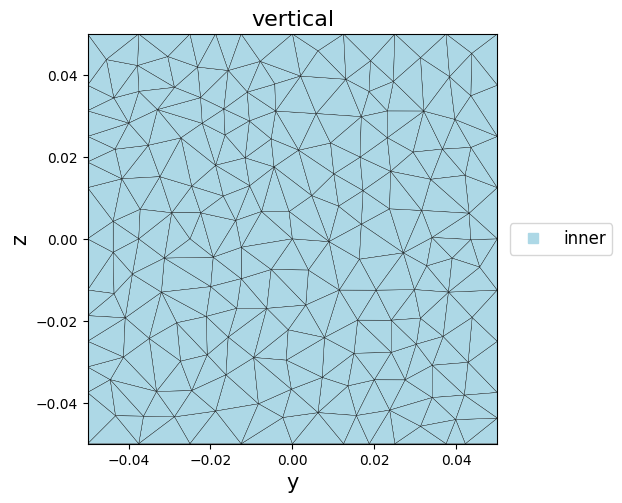

OPSTOOL™ :: The section vertical base has been successfully meshed!

                           Frame Section Properties                            
┏━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Symbol    ┃ Value                  ┃ Definition                             ┃
┡━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│ A         │ 1.000E-02              │ Cross-sectional area                   │
│ centroid  │ (0.000E+00, 0.000E+00) │ Elastic centroid                       │
│ Iy        │ 8.333E-06              │ Moment of inertia y-axis               │
│ Iz        │ 8.333E-06              │ Moment of inertia z-axis               │
│ Iyz       │ 1.694E-20              │ Product of inertia                     │
│ Wyt       │ 1.667E-04              │ Section moduli of top fibres y-axis    │
│ Wyb       │ 1.667E-04              │ Section moduli of bottom fibres y-axis │
│ Wzt       │ 1.667E-04              │ Section moduli of top fibres z-axis    │
│ Wzb       │ 1.667E-04              │ Section moduli of bottom fibres z-axis │
│ J         │ 1.406E-05              │ Torsion constant                       │
│ phi       │ 0.000E+00              │ Principal axis angle                   │
│ rho_rebar │ 0.000E+00              │ Ratio of reinforcement                 │
└───────────┴────────────────────────┴────────────────────────────────────────┘

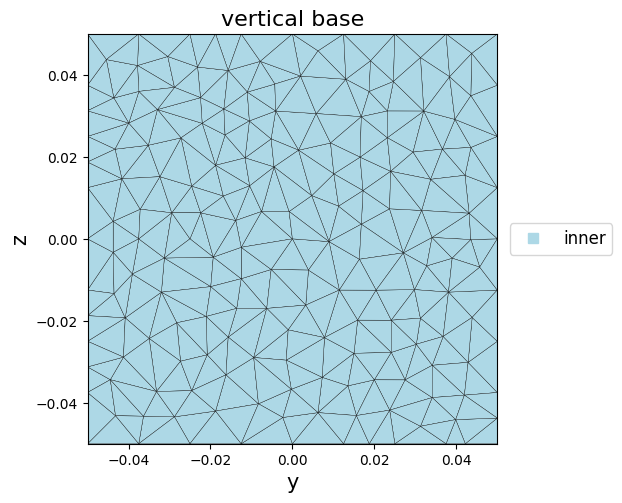

OPSTOOL™ :: The section oblique has been successfully meshed!

                           Frame Section Properties                            
┏━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Symbol    ┃ Value                  ┃ Definition                             ┃
┡━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│ A         │ 4.000E-04              │ Cross-sectional area                   │
│ centroid  │ (0.000E+00, 0.000E+00) │ Elastic centroid                       │
│ Iy        │ 1.333E-08              │ Moment of inertia y-axis               │
│ Iz        │ 1.333E-08              │ Moment of inertia z-axis               │
│ Iyz       │ 0.000E+00              │ Product of inertia                     │
│ Wyt       │ 1.333E-06              │ Section moduli of top fibres y-axis    │
│ Wyb       │ 1.333E-06              │ Section moduli of bottom fibres y-axis │
│ Wzt       │ 1.333E-06              │ Section moduli of top fibres z-axis    │
│ Wzb       │ 1.333E-06              │ Section moduli of bottom fibres z-axis │
│ J         │ 2.249E-08              │ Torsion constant                       │
│ phi       │ 0.000E+00              │ Principal axis angle                   │
│ rho_rebar │ 0.000E+00              │ Ratio of reinforcement                 │
└───────────┴────────────────────────┴────────────────────────────────────────┘

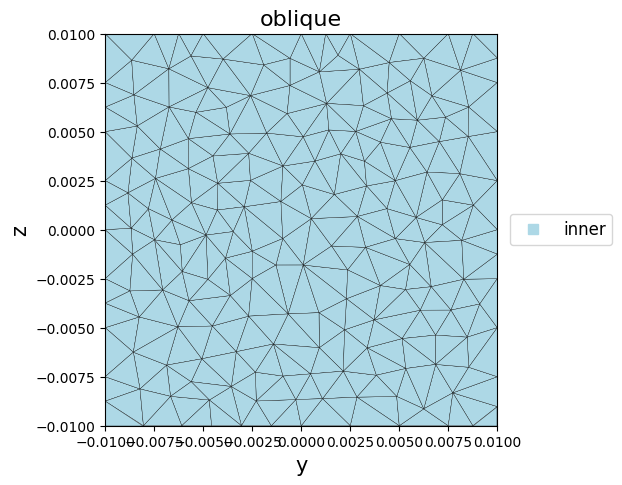

WARNING ZeroLength::setDomain(): Element 5 has L= 0.2, which is greater than the tolerance
ZeroLengthSection::setDomain() -- Element 4has L= 0.2, which is greater than the tolerance


CASE: zeroLength & zeroLengthSection


🚀 OPSTOOL::SmartAnalyze: 100%|██████████| 840/840 [00:09<00:00, 92.05 step/s]


Note: OpenSees LogFile has been generated in .SmartAnalyze-OpenSees.log.
>>> 🎉 OPSTOOL::SmartAnalyze:: Successfully finished! Time consumption: 9.136 s. 🎉


OPSTOOL™ ::  All responses data with _odb_tag = 1 saved in ./OutData\RespStepData-1.odb!

In [6]:
# Case
CASE_1 = 1

'''For Case 1, I just want to look at the hysteresis curve with only vertical element.'''

# Create model
model_info = triangleStruc(top_free=True, base_free=True, info=True)

# Remove oblique element
ops.remove('ele', model_info.remove_ele)

# Create data base
opst.post.set_odb_format(odb_format="nc") # opstool.version >= 1.0.25
ODB = opst.post.CreateODB(odb_tag=CASE_1, fiber_ele_tags="ALL", model_update=True, zlib=True) # zlib need opstool.version >= 1.0.25

"# ----- ----- ----- ----- ----- ----- ----- ----- ----- ----- ----- ----- ----- ----- ----- -----"
# Linear timeSeries
ts = 1
ops.timeSeries("Linear", ts)

# Displacement path
disp_path = np.array([
    0.,
    0.05, -0.05,
    0.10, -0.10,
    0.15, -0.15,
    0.20, -0.20,
    0.25, -0.25,
    0.30, -0.30,
    0.
    ]) * UNIT.m

# Analysis
disp, force = analysisLib(
    tsTag=ts,
    dof=2, ctrl_node=model_info.ctrl_node,
    targets=disp_path, max_step=0.005 * UNIT.m,
    ODB=ODB
    )

"# ----- ----- ----- ----- ----- ----- ----- ----- ----- ----- ----- ----- ----- ----- ----- -----"
# Save data base
ODB.save_response()

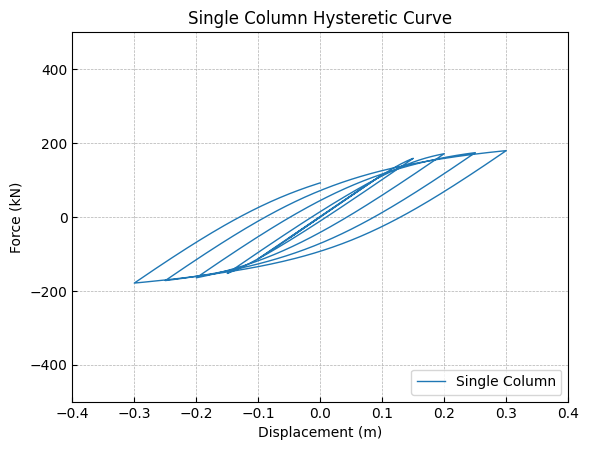

In [7]:
# View results
plt.close('all')
plt.title('Single Column Hysteretic Curve')
plt.plot(disp, force, linewidth=1.0, label='Single Column', zorder=2)
plt.xlim(-0.4, 0.4)
plt.ylim(-500 * UNIT.kn, 500 * UNIT.kn)
plt.xlabel('Displacement (m)')
plt.ylabel('Force (kN)')
plt.legend(loc='lower right', bbox_to_anchor=(1.0, 0.0))
plt.grid(linestyle='--', linewidth=0.5, zorder=1)
plt.show()

In [8]:
# Visualize model response
fig = opsplt.plot_nodal_responses_animation(odb_tag=CASE_1, resp_type='disp', show_undeformed=True)
fig.show()

OPSTOOL™ ::  Loading responses data from ./OutData\RespStepData-1.odb ...

# Remove and add element during analysis

In [9]:
# Case
CASE_2 = 2

'''Ok, For case 2 I want to remove and add element during analysis.'''

# Create model
model_info = triangleStruc(top_free=True, base_free=True, info=False)

# Create data base
opst.post.set_odb_format(odb_format="nc") # opstool.version >= 1.0.25
ODB = opst.post.CreateODB(odb_tag=CASE_2, fiber_ele_tags="ALL", model_update=True, zlib=True) # zlib need opstool.version >= 1.0.25

"# ----- ----- ----- ----- ----- ----- ----- ----- ----- ----- ----- ----- ----- ----- ----- -----"
# Linear timeSeries
ts = 1
ops.timeSeries("Linear", ts)

# Displacement path
disp_path_1 = np.array([
    0.,
    0.05, -0.05,
    0.10, -0.10,
    0.15, -0.15,
    0.17  # break at 0.17
    # 0.20, -0.20,
    # 0.25, -0.25,
    # 0.30, -0.30,
    # 0.
    ]) * UNIT.m

# Analysis
disp_1, force_1 = analysisLib(
    tsTag=ts,
    dof=2, ctrl_node=model_info.ctrl_node,
    targets=disp_path_1, max_step=0.005 * UNIT.m,
    ODB=ODB
    )

"# ----- ----- ----- ----- ----- ----- ----- ----- ----- ----- ----- ----- ----- ----- ----- -----"
# Remove element
ops.loadConst('-time', 0.0) # Important !!!
ops.remove('ele', model_info.remove_ele) # Remove element

# Displacement path (After remove element)
disp_path_2 = np.array([
    # 0.,
    # 0.05, -0.05,
    # 0.10, -0.10,
    # 0.15, -0.15,
    0.17, # continue from 0.17
    0.20, -0.20,
    0.25, -0.25,
    0.30, -0.30,
    0.
    ]) * UNIT.m

# Analysis
disp_2, force_2 = analysisLib(
    tsTag=ts,
    dof=2, ctrl_node=model_info.ctrl_node,
    targets=disp_path_2, max_step=0.005 * UNIT.m,
    ODB=ODB
    )

"# ----- ----- ----- ----- ----- ----- ----- ----- ----- ----- ----- ----- ----- ----- ----- -----"
# Add element
ops.loadConst('-time', 0.0) # Important !!!
ops.element(*model_info.add_ele) # Add element

# Displacement path (After add element)
disp_path_3 = np.array([
    0.,
    0.05, -0.05,
    0.10, -0.10,
    0.15, -0.15,
    0.20, -0.20,
    0.25, -0.25,
    0.30, -0.30,
    0.30
    ]) * UNIT.m

# Analysis
disp_3, force_3 = analysisLib(
    tsTag=ts,
    dof=2, ctrl_node=model_info.ctrl_node,
    targets=disp_path_3, max_step=0.005 * UNIT.m,
    ODB=ODB
    )

"# ----- ----- ----- ----- ----- ----- ----- ----- ----- ----- ----- ----- ----- ----- ----- -----"
# Save data base
ODB.save_response()

OPSTOOL™ :: The section vertical has been successfully meshed!

OPSTOOL™ :: The section vertical base has been successfully meshed!

OPSTOOL™ :: The section oblique has been successfully meshed!

CASE: zeroLength & zeroLengthSection


🚀 OPSTOOL::SmartAnalyze: 100%|██████████| 274/274 [00:03<00:00, 75.06 step/s]


Note: OpenSees LogFile has been generated in .SmartAnalyze-OpenSees.log.
>>> 🎉 OPSTOOL::SmartAnalyze:: Successfully finished! Time consumption: 3.653 s. 🎉


🚀 OPSTOOL::SmartAnalyze: 100%|██████████| 566/566 [00:06<00:00, 92.41 step/s]


Note: OpenSees LogFile has been generated in .SmartAnalyze-OpenSees.log.
>>> 🎉 OPSTOOL::SmartAnalyze:: Successfully finished! Time consumption: 6.128 s. 🎉


🚀 OPSTOOL::SmartAnalyze: 100%|██████████| 900/900 [00:12<00:00, 74.72 step/s]


Note: OpenSees LogFile has been generated in .SmartAnalyze-OpenSees.log.
>>> 🎉 OPSTOOL::SmartAnalyze:: Successfully finished! Time consumption: 12.048 s. 🎉


OPSTOOL™ ::  All responses data with _odb_tag = 2 saved in ./OutData\RespStepData-2.odb!

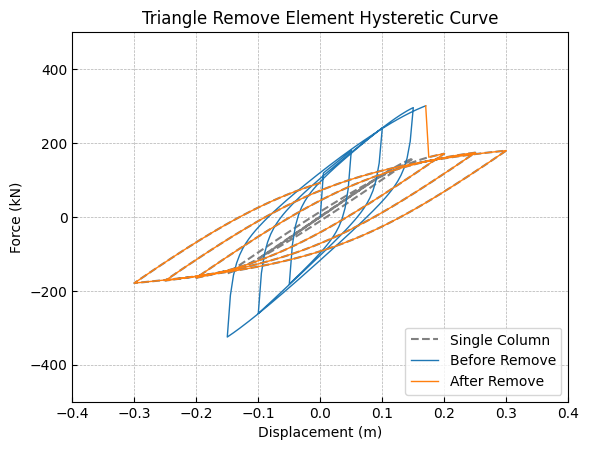

In [10]:
# View results (After remove element)
plt.close('all')
plt.title('Triangle Remove Element Hysteretic Curve')

plt.plot(disp, force, label='Single Column', color='gray', linewidth=1.5, linestyle='--', zorder=2)
plt.plot(disp_1, force_1, linewidth=1.0, label='Before Remove', zorder=3)
plt.plot(disp_2, force_2 + force_1[-1], linewidth=1.0, label='After Remove', zorder=3)

plt.xlim(-0.4, 0.4)
plt.ylim(-500 * UNIT.kn, 500 * UNIT.kn)
plt.xlabel('Displacement (m)')
plt.ylabel('Force (kN)')
plt.legend(loc='lower right', bbox_to_anchor=(1.0, 0.0))
plt.grid(linestyle='--', linewidth=0.5, zorder=1)
plt.show()

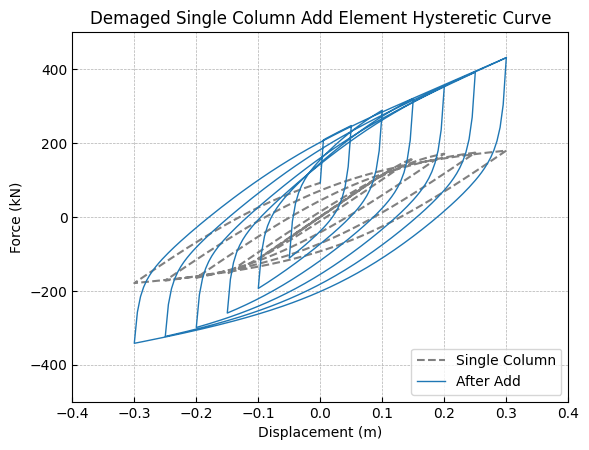

In [11]:
# View results (After add element)
plt.close('all')
plt.title('Demaged Single Column Add Element Hysteretic Curve')

plt.plot(disp, force, label='Single Column', color='gray', linewidth=1.5, linestyle='--', zorder=2)
plt.plot(disp_3, force_3 + force_1[-1] + force_2[-1], linewidth=1.0, label='After Add', zorder=3)

plt.xlim(-0.4, 0.4)
plt.ylim(-500 * UNIT.kn, 500 * UNIT.kn)
plt.xlabel('Displacement (m)')
plt.ylabel('Force (kN)')
plt.legend(loc='lower right', bbox_to_anchor=(1.0, 0.0))
plt.grid(linestyle='--', linewidth=0.5, zorder=1)
plt.show()

In [12]:
# Visualize model responses
fig = opsplt.plot_nodal_responses_animation(odb_tag=CASE_2, resp_type='disp', show_undeformed=True)
fig.show()

OPSTOOL™ ::  Loading responses data from ./OutData\RespStepData-2.odb ...

# Check link element responses

In [13]:
# Visualize final model (Case 2)
opsplt.set_plot_props(point_size=5, line_width=3)
fig = opsplt.plot_model(show_ele_numbering=True,show_local_axes=True,)
fig.show()

In [14]:
# Check zeroLength element
ODB_ele_Link = opst.post.get_element_responses(odb_tag=CASE_2, ele_type="Link", print_info=False)
print(f"ODB_ele_link.eleTags: {ODB_ele_Link.eleTags.values}")

# Check zeroLengthSection element
ODB_ele_sec = opst.post.get_element_responses(odb_tag=CASE_2, ele_type="FiberSection", print_info=False)
print(f"ODB_ele_sec.eleTags: {ODB_ele_sec.eleTags.values}")

ODB_ele_link.eleTags: [4 5]
ODB_ele_sec.eleTags: [1 2 3 4]


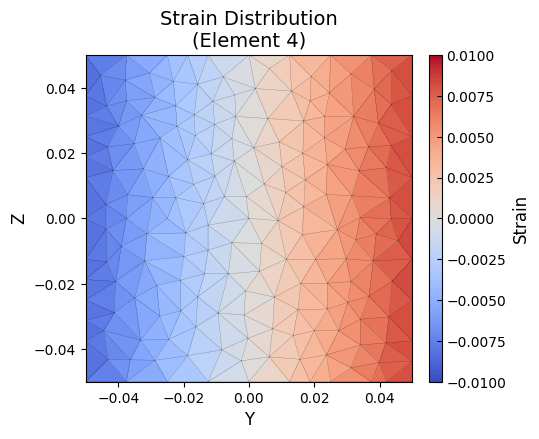

In [15]:
ys = ODB_ele_sec['ys'].sel(eleTags = model_info.base_link_ele, secPoints = 1)
zs = ODB_ele_sec['zs'].sel(eleTags = model_info.base_link_ele, secPoints = 1)
strain = ODB_ele_sec['Strains'].sel(eleTags = model_info.base_link_ele, secPoints = 1).isel(time = -1)
points_all = np.stack((ys.values, zs.values), axis=-1) # include nan

plt.close('all')
fig, ax = plt.subplots(figsize=(6, 4))
ax, cbar = model_info.sections['sec_2']['code'].plot_response(
    points=points_all,  # (num_fiber_points, 2)
    response=strain.values,  # (num_fiber_points,)
    cmap='coolwarm',
    ax=ax,
)
fig.tight_layout(rect=(0, 0, 1, 1))
cbar.set_label("Strain", fontsize=12)
ax.set_title(f"Strain Distribution\n(Element {model_info.base_link_ele})", fontsize=14)
ax.set_xlabel("Y", fontsize=12)
ax.set_ylabel("Z", fontsize=12)
cbar.mappable.set_clim(-0.01, 0.01)
plt.show()